# Lab 6

You are tasked with evaluating card counting strategies for black jack. In order to do so, you will use object oriented programming to create a playable casino style black jack game where a computer dealer plays against $n$ computer players and possibily one human player. If you don't know the rules of blackjack or card counting, please google it. 

A few requirements:
* The game should utilize multiple 52-card decks. Typically the game is played with 6 decks.
* Players should have chips.
* Dealer's actions are predefined by rules of the game (typically hit on 16). 
* The players should be aware of all shown cards so that they can count cards.
* Each player could have a different strategy.
* The system should allow you to play large numbers of games, study the outcomes, and compare average winnings per hand rate for different strategies.

1. Begin by creating a classes to represent cards and decks. The deck should support more than one 52-card set. The deck should allow you to shuffle and draw cards. Include a "plastic" card, placed randomly in the deck. Later, when the plastic card is dealt, shuffle the cards before the next deal.

In [1]:
import random
import matplotlib.pyplot as plt
import numpy as np

In [2]:
#Begin with Card and Deck classes

class Card:
    def __init__(self, rank, suit):
        self.rank = rank
        self.suit = suit
    
    def __repr__(self):
        return f"{self.rank} of {self.suit}"
    
class Deck:
    ranks = ['2', '3', '4', '5', '6', '7', '8', '9', 'Jack', 'Queen', 'King', 'Ace']
    suits = ['Hearts', 'Diamonds', 'Clubs', 'Spades']
    
    def __init__(self, num_decks=6): #the number of decks has a default of 6 rn
        self.cards = []
        for n in range(num_decks):
            self.cards += [Card(rank, suit) for suit in Deck.suits for rank in Deck.ranks]
            
        self.shuffle()
        self.plastic_card_index = random.randint(0, len(self.cards) - 1)
            
    def shuffle(self):
        random.shuffle(self.cards)
        
    def draw(self):
        if len(self.cards) == 0:
            return None # for an empty deck
        # Check for plastic card
        if len(self.cards) == self.plastic_card_index + 1:
            print("Plastic card drawn, reshuffling")
            self.shuffle()

        return self.cards.pop(0)


In [3]:
#Test

deck = Deck(num_decks=1)

for n in range(5):
    print(deck.draw())

2 of Diamonds
9 of Clubs
Jack of Clubs
3 of Diamonds
3 of Spades


2. Now design your game on a UML diagram. You may want to create classes to represent, players, a hand, and/or the game. As you work through the lab, update your UML diagram. At the end of the lab, submit your diagram (as pdf file) along with your notebook. 

3. Begin with implementing the skeleton (ie define data members and methods/functions, but do not code the logic) of the classes in your UML diagram.

In [4]:
# cards (which we've already done)
class Card: 
    def __init__(self, suit, rank):
        self.suit = suit  
        self.rank = rank  
    def get_value(self):
        pass
    def __repr__(self):
        pass
    
# deck (which we've already done) 
class Deck:
    def __init__(self, num_decks=6):
        self.cards = []  
        self.plastic_card_pos = 0
        self.num_decks = num_decks  
    def draw_card(self):
        pass
    def shuffle(self):
        pass
    
#hand 
class Hand:
    def __init__(self):
        # Data members
        self.cards = []  # List of Card objects
        self.value = 0    # Value of the hand (calculated based on cards)
    def add_card(self, card):
        pass
    def calculate_value(self):
        pass

#strategy
class Strategy:
    def __init__(self):
        # Data members
        pass

    def execute(self, hand, dealer_card, deck):
        pass

#player info    
class Player:
    def __init__(self, name, strategy=None):
        # Data members
        self.name = name  # Name of the player
        self.chips = 1000  # Chips for the player
        self.hand = Hand()  # Player's hand
        self.strategy = strategy if strategy else Strategy()  # Strategy for the player
    def place_bet(self, amount):
        pass
    def play_turn(self, deck):
        pass
    
#game rules
class BJGame:
    def __init__(self, num_players=1, num_decks=6): #default game info
        self.players = []  # List of Players
        self.dealer = Player(chips=1000)  # make sure the dealer is also a player and gets money, there will always be a dealer
        self.deck = Deck(num_decks)
        self.rounds = 0 #number of rounds played
        self.previous_chips = {player.name: player.chips for player in self.players}
        
        # Add players to the game
        for i in range(num_players):
            self.players.append(Player(f"Player {i + 1}"))
    def start_game(self):
        pass
    def deal_initial(self):
        pass
    def play_round(self):
        pass
    def end_game(self): # how to determine a winner each round
        pass

4. Complete the implementation by coding the logic of all functions. For now, just implement the dealer player and human player.

In [5]:
import random

# Card
class Card:
    def __init__(self, suit, rank):
        self.suit = suit  
        self.rank = rank  
    def get_value(self):
        if self.rank in ['Jack', 'Queen', 'King']:
            return 10
        elif self.rank == 'Ace':
            return 11
        else:
            return int(self.rank)
    def __repr__(self):
        return f"{self.rank} of {self.suit}"

# Deck 
class Deck:
    def __init__(self, num_decks=6):
        self.cards = []
        self.num_decks = num_decks
        self.build_deck()
        self.shuffle()
        self.plastic_card_pos = random.randint(0, len(self.cards) - 1)
    def build_deck(self):
        suits = ['Hearts', 'Diamonds', 'Clubs', 'Spades']
        ranks = ['2', '3', '4', '5', '6', '7', '8', '9', '10', 'Jack', 'Queen', 'King', 'Ace']
        for _ in range(self.num_decks):
            for suit in suits:
                for rank in ranks:
                    self.cards.append(Card(suit, rank))
    def shuffle(self):
        random.shuffle(self.cards)
    def draw_card(self):
        if len(self.cards) == self.plastic_card_pos:
            print("Plastic card reached. Reshuffling deck.")
            self.shuffle()
        return self.cards.pop() if self.cards else None

    
# Hand 
class Hand:
    def __init__(self):
        self.cards = []
        self.value = 0
        self.aces = 0
    def add_card(self, card):
        self.cards.append(card)
        self.value += card.get_value()
        if card.rank == 'Ace':
            self.aces += 1
        self.adjust_for_ace()
    def adjust_for_ace(self):
        while self.value > 21 and self.aces:
            self.value -= 10
            self.aces -= 1
    def calculate_value(self):
        return self.value

# Strategy 
class Strategy:
    def execute(self, hand, dealer_card, deck):
        if hand.calculate_value() < 15:
            return 'hit'
        else:
            return 'stand'

# Player 
class Player:
    def __init__(self, name, strategy=None):
        self.name = name
        self.chips = 1000
        self.hand = Hand()
        self.strategy = strategy if strategy else Strategy()  # Default strategy
        self.card_sum = 0  # ability for custom strategy
    def place_bet(self, amount):
        if amount <= self.chips:
            self.chips -= amount
            return amount
        else:
            return 0  # If the player doesn't have enough chips :(
    def play_turn(self, deck):
        while True:
            action = self.strategy.execute(self.hand, deck.cards[-1], deck)
            if action == 'hit':
                card = deck.draw_card()
                self.hand.add_card(card)
                print(f"{self.name} hits: {card}")
                if self.hand.calculate_value() > 21:
                    print(f"{self.name} busts with {self.hand.calculate_value()} :(")
                    return 'bust'
            elif action == 'stand':
                print(f"{self.name} stands with {self.hand.calculate_value()}")
                return 'stand'

            

# Dealer 
class Dealer(Player):
    def __init__(self):
        super().__init__("Dealer", Strategy())
    def play_turn(self, deck):
        while self.hand.calculate_value() < 17:  # Dealer must hit on values < 17
            card = deck.draw_card()
            self.hand.add_card(card)
            print(f"Dealer hits: {card}")
        if self.hand.calculate_value() > 21:  # Check if dealer busts
            self.busted = True
            print("Dealer busts")
            return 'bust'
        print(f"Dealer stands with {self.hand.calculate_value()}")
        return 'stand'

    
# BJGame 
class BJGame:
    def __init__(self, num_players=2, num_decks=6):
        self.deck = Deck(num_decks)
        self.dealer = Dealer()
        self.players = [Player(f"Player {i+1}") for i in range(num_players)]
        self.previous_chips = {player.name: player.chips for player in self.players}
        self.rounds = 0
        print("Starting game!")

    def start_game(self):
        self.rounds += 1
        self.dealer.hand = Hand()  # Reset dealer's hand
        for player in self.players:
            player.hand = Hand()  # Reset each player's hand
    
    def reset_game(self): #Reset the cards for each round
        self.deck = Deck() 
        self.deck.shuffle()  
        for player in self.players:
            player.hand = Hand() 
        self.dealer.hand = Hand() 
    
    def deal_initial(self):
        for _ in range(2):  # Deal 2 cards to each player and dealer
            for player in self.players:
                card = self.deck.draw_card()
                player.hand.add_card(card)
                print(f"{player.name} gets {card}")
            card = self.deck.draw_card()
            self.dealer.hand.add_card(card)
            print(f"Dealer shows {card}")
            
    def track_chip_changes(self):
        for player in self.players:
            if player.name not in self.previous_chips:
                self.previous_chips[player.name] = player.chips
            chip_change = player.chips - self.previous_chips[player.name]
            status = "gained" if chip_change > 0 else "lost"
            print(f"{player.name} {status} {abs(chip_change)} chips.")
            self.previous_chips[player.name] = player.chips # update the previous chips for the next round


    def play_round(self):
        self.reset_game()  
        self.start_game()  
        self.deal_initial()
        for player in self.players:
            print(f"\n{player.name}'s turn:")
            player.play_turn(self.deck)
            if player.hand.calculate_value() > 21:
                print(f"{player.name} busts with {player.hand.calculate_value()} :(")
        print("\nDealer's turn:")
        self.dealer.play_turn(self.deck)

        # Determine winner
        self.determine_winner()
        
        # Track and display chip changes
        self.track_chip_changes()

    def determine_winner(self):
        dealer_value = self.dealer.hand.calculate_value()
        print(f"Dealer's final hand: {self.dealer.hand.cards}, Value: {dealer_value}")
        
        for player in self.players:
            player_value = player.hand.calculate_value()
            print(f"{player.name}'s final hand: {player.hand.cards}, Value: {player_value}")
            
            if player_value > 21:
                print(f"{player.name} busted :(")
            elif dealer_value > 21 or player_value > dealer_value:
                print(f"{player.name} wins!")
                player.chips += 100  # Player wins 100 chips for now
            elif player_value == dealer_value:
                print(f"{player.name} ties with the dealer!")
            else:
                print(f"Dealer wins against {player.name}.")
    
    def reset_game(self):
        self.deck = Deck()
        self.deck.shuffle() 
        for player in self.players:
            player.hand = Hand() 
        self.dealer.hand = Hand() 


In [6]:
# Testing
game = BJGame(num_players=2, num_decks=1)
game.start_game()
game.deal_initial()
game.play_round()

Starting game!
Player 1 gets King of Clubs
Player 2 gets 8 of Hearts
Dealer shows 7 of Spades
Player 1 gets Ace of Spades
Player 2 gets Ace of Hearts
Dealer shows 10 of Hearts
Player 1 gets 5 of Diamonds
Player 2 gets Queen of Clubs
Dealer shows 4 of Clubs
Player 1 gets Jack of Clubs
Player 2 gets 10 of Hearts
Dealer shows 4 of Hearts

Player 1's turn:
Player 1 stands with 15

Player 2's turn:
Player 2 stands with 20

Dealer's turn:
Dealer hits: Ace of Clubs
Dealer stands with 19
Dealer's final hand: [4 of Clubs, 4 of Hearts, Ace of Clubs], Value: 19
Player 1's final hand: [5 of Diamonds, Jack of Clubs], Value: 15
Dealer wins against Player 1.
Player 2's final hand: [Queen of Clubs, 10 of Hearts], Value: 20
Player 2 wins!
Player 1 lost 0 chips.
Player 2 gained 100 chips.


5.  Test. Demonstrate game play. For example, create a game of several dealer players and show that the game is functional through several rounds.

In [7]:
# Testing
game = BJGame(num_players=4, num_decks=6)


for round_number in range(5):
    print(f"\n--- Round {round_number + 1} ---")
    game.play_round()


Starting game!

--- Round 1 ---
Player 1 gets 4 of Spades
Player 2 gets 5 of Hearts
Player 3 gets Queen of Diamonds
Player 4 gets King of Spades
Dealer shows Queen of Spades
Player 1 gets 7 of Diamonds
Player 2 gets 3 of Spades
Player 3 gets 2 of Spades
Player 4 gets 4 of Diamonds
Dealer shows Ace of Diamonds

Player 1's turn:
Player 1 hits: 6 of Hearts
Player 1 stands with 17

Player 2's turn:
Player 2 hits: King of Diamonds
Player 2 stands with 18

Player 3's turn:
Player 3 hits: 2 of Spades
Player 3 hits: 9 of Spades
Player 3 busts with 23 :(
Player 3 busts with 23 :(

Player 4's turn:
Player 4 hits: 5 of Diamonds
Player 4 stands with 19

Dealer's turn:
Dealer stands with 21
Dealer's final hand: [Queen of Spades, Ace of Diamonds], Value: 21
Player 1's final hand: [4 of Spades, 7 of Diamonds, 6 of Hearts], Value: 17
Dealer wins against Player 1.
Player 2's final hand: [5 of Hearts, 3 of Spades, King of Diamonds], Value: 18
Dealer wins against Player 2.
Player 3's final hand: [Queen o

6. Implement a new player with the following strategy:

    * Assign each card a value: 
        * Cards 2 to 6 are +1 
        * Cards 7 to 9 are 0 
        * Cards 10 through Ace are -1
    * Compute the sum of the values for all cards seen so far.
    * Hit if sum is very negative, stay if sum is very positive. Select a threshold for hit/stay, e.g. 0 or -2.  

In [8]:
class ElitePlayerStrategy:
    def __init__(self, threshold=-2):
        self.threshold = threshold 
        self.card_values = {
            '2': 1, '3': 1, '4': 1, '5': 1, '6': 1,
            '7': 0, '8': 0, '9': 0,
            '10': -1, 'Jack': -1, 'Queen': -1, 'King': -1, 'Ace': -1
        }
        self.card_sum = 0 
    def update_sum(self, hand):
        self.card_sum = sum([self.card_values[card.rank] for card in hand.cards])
    def execute(self, hand, dealer_card, deck):
        self.update_sum(hand)
        if self.card_sum <= self.threshold:
            return 'hit'
        else:
            return 'stand'


In [9]:
elite_strategy = ElitePlayerStrategy(threshold=-2)

elite_player = Player(name="Elite Player", strategy=elite_strategy)

game = BJGame(num_players=2, num_decks=6)
game.players.append(elite_player) 

for round_number in range(5):
    print(f"\n--- Round {round_number + 1} ---")
    game.play_round()
    game.start_game()
    game.play_round()


Starting game!

--- Round 1 ---
Player 1 gets 7 of Hearts
Player 2 gets 4 of Clubs
Elite Player gets 10 of Clubs
Dealer shows 4 of Hearts
Player 1 gets 3 of Diamonds
Player 2 gets 8 of Hearts
Elite Player gets Jack of Spades
Dealer shows 9 of Clubs

Player 1's turn:
Player 1 hits: King of Diamonds
Player 1 stands with 20

Player 2's turn:
Player 2 hits: 7 of Clubs
Player 2 stands with 19

Elite Player's turn:
Elite Player hits: Queen of Diamonds
Elite Player busts with 30 :(
Elite Player busts with 30 :(

Dealer's turn:
Dealer hits: 2 of Diamonds
Dealer hits: Queen of Spades
Dealer busts
Dealer's final hand: [4 of Hearts, 9 of Clubs, 2 of Diamonds, Queen of Spades], Value: 25
Player 1's final hand: [7 of Hearts, 3 of Diamonds, King of Diamonds], Value: 20
Player 1 wins!
Player 2's final hand: [4 of Clubs, 8 of Hearts, 7 of Clubs], Value: 19
Player 2 wins!
Elite Player's final hand: [10 of Clubs, Jack of Spades, Queen of Diamonds], Value: 30
Elite Player busted :(
Player 1 gained 100 ch

7. Create a test scenario where one player, using the above strategy, is playing with a dealer and 3 other players that follow the dealer's strategy. Each player starts with same number of chips. Play 50 rounds (or until the strategy player is out of money). Compute the strategy player's winnings. You may remove unnecessary printouts from your code (perhaps implement a verbose/quiet mode) to reduce the output.

In [10]:
### adding verbose mode to script

class BJGame:
    def __init__(self, num_players=4, num_decks=6, verbose=True):
        self.deck = Deck(num_decks)
        self.dealer = Dealer()
        self.players = [Player(f"Player {i+1}") for i in range(num_players)]
        self.previous_chips = {player.name: player.chips for player in self.players}
        self.rounds = 0
        self.verbose = verbose  # Control print statements
        if self.verbose:
            print("Starting game!")

    def reset_game(self):
        self.deck = Deck()
        self.deck.shuffle()
        for player in self.players:
            player.hand = Hand()
        self.dealer.hand = Hand()

    def start_game(self):
        self.rounds += 1
        self.dealer.hand = Hand()
        for player in self.players:
            player.hand = Hand()

    def deal_initial(self):
        for _ in range(2):
            for player in self.players:
                card = self.deck.draw_card()
                player.hand.add_card(card)
                if self.verbose:
                    print(f"{player.name} gets {card}")
            card = self.deck.draw_card()
            self.dealer.hand.add_card(card)
            if self.verbose:
                print(f"Dealer shows {card}")
                
    def track_chip_changes(self):
        for player in self.players:
            if player.name not in self.previous_chips:
                self.previous_chips[player.name] = player.chips
            chip_change = player.chips - self.previous_chips[player.name]
            status = "gained" if chip_change > 0 else "lost"
            print(f"{player.name} {status} {abs(chip_change)} chips.")
            self.previous_chips[player.name] = player.chips

    def play_round(self):
        self.reset_game()
        self.start_game()
        self.deal_initial()

        # players turn
        for player in self.players:
            if self.verbose:
                print(f"\n{player.name}'s turn:")
            player.play_turn(self.deck)

        # dealer's turn
        if self.verbose:
            print("\nDealer's turn:")
        self.dealer.play_turn(self.deck)

        # determine winners
        self.determine_winner()
        
        # Track and display chip changes
        self.track_chip_changes()

    def determine_winner(self):
        dealer_value = self.dealer.hand.calculate_value()
        if self.verbose:
            print(f"Dealer's final hand: {self.dealer.hand.cards}, Value: {dealer_value}")
        
        for player in self.players:
            player_value = player.hand.calculate_value()
            if self.verbose:
                print(f"{player.name}'s final hand: {player.hand.cards}, Value: {player_value}")

            if player_value > 21:
                if self.verbose:
                    print(f"{player.name} busted :(")
            elif dealer_value > 21 or player_value > dealer_value:
                if self.verbose:
                    print(f"{player.name} wins!")
                player.chips += 20  # Player wins 20 chips
            elif player_value == dealer_value:
                if self.verbose:
                    print(f"{player.name} ties with the dealer!")
            else:
                if self.verbose:
                    print(f"Dealer wins against {player.name}.")

Elite Player stands with 10
Player 2 hits: 3 of Hearts
Player 2 stands with 17
Player 3 hits: 8 of Hearts
Player 3 busts with 22 :(
Player 4 hits: 8 of Clubs
Player 4 stands with 19
Dealer hits: 5 of Spades
Dealer stands with 18
Elite Player lost 0 chips.
Player 2 lost 0 chips.
Player 3 lost 0 chips.
Player 4 gained 20 chips.
Elite Player stands with 13
Player 2 stands with 18
Player 3 hits: 4 of Clubs
Player 3 stands with 16
Player 4 hits: 7 of Clubs
Player 4 stands with 19
Dealer hits: King of Diamonds
Dealer busts
Elite Player gained 10 chips.
Player 2 gained 10 chips.
Player 3 gained 10 chips.
Player 4 gained 10 chips.
Elite Player stands with 16
Player 2 stands with 20
Player 3 stands with 16
Player 4 stands with 15
Dealer hits: Queen of Hearts
Dealer stands with 21
Elite Player lost 10 chips.
Player 2 lost 10 chips.
Player 3 lost 10 chips.
Player 4 lost 10 chips.
Elite Player stands with 12
Player 2 stands with 17
Player 3 hits: 2 of Diamonds
Player 3 hits: 2 of Spades
Player 3 h

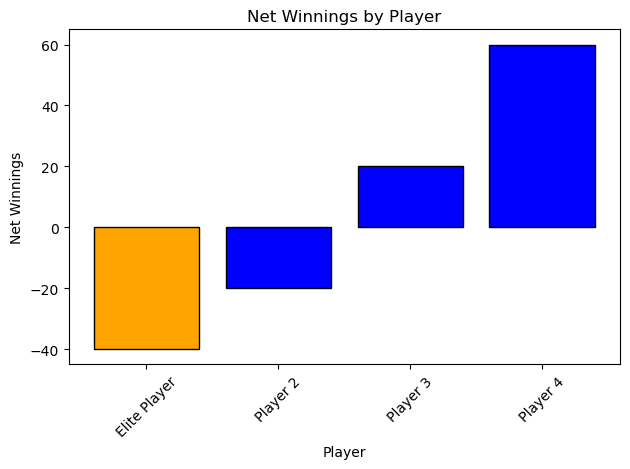

In [11]:
# test scenario
def test_elite_strategy():
    num_players = 4
    num_rounds = 50
    starting_chips = 1000
    verbose = False

    game = BJGame(num_players=num_players, verbose=verbose)

    # Setting up strategies
    game.players[0] = Player(name="Elite Player", strategy=ElitePlayerStrategy(threshold=-2))
    for i in range(1, num_players):
        game.players[i] = Player(name=f"Player {i + 1}")

    # initial chips
    for player in game.players:
        player.chips = starting_chips

    # Track the elite player's performance and end game when yhey've run out of chips
    for _ in range(num_rounds):
        elite_player = game.players[0]
        if elite_player.chips <= 0:
            break  # Stop if Elite Player is out of chips

        game.play_round()

        for player in game.players:
            player.place_bet(min(10, player.chips))

    # results
    elite_player = game.players[0]
    print(f"Final chips for {elite_player.name}: {elite_player.chips}")
    print(f"Net winnings: {elite_player.chips - starting_chips}")

    # Graph the final winnings and compare the players 
    final_winnings = [player.chips - starting_chips for player in game.players]
 
    colors = ['blue'] * num_players  # Default players will be blue
    colors[0] = 'orange'  # Elite Player will be orange

    plt.bar(range(len(final_winnings)), final_winnings, color=colors, edgecolor='black')
    plt.xticks(range(len(final_winnings)), [player.name for player in game.players], rotation=45)
    plt.title("Net Winnings by Player")
    plt.xlabel("Player")
    plt.ylabel("Net Winnings")
    plt.tight_layout()
    plt.show()
    
# run the test
test_elite_strategy()


8. Create a loop that runs 100 games of 50 rounds, as setup in previous question, and store the strategy player's chips at the end of the game (aka "winnings") in a list. Histogram the winnings. What is the average winnings per round? What is the standard deviation. What is the probabilty of net winning or lossing after 50 rounds?


Game 1, Round 1
Elite Player stands with 16
Player 2 hits: Jack of Clubs
Player 2 busts with 22 :(
Player 3 stands with 17
Player 4 hits: 4 of Spades
Player 4 stands with 18
Dealer hits: 6 of Clubs
Dealer hits: 10 of Hearts
Dealer busts
Elite Player lost 0 chips.
Player 2 lost 500 chips.
Player 3 lost 480 chips.
Player 4 lost 480 chips.
Game 1, Round 2
Elite Player stands with 4
Player 2 stands with 15
Player 3 hits: 5 of Clubs
Player 3 stands with 17
Player 4 hits: 8 of Spades
Player 4 hits: 9 of Diamonds
Player 4 busts with 23 :(
Dealer hits: King of Spades
Dealer busts
Elite Player gained 10 chips.
Player 2 gained 10 chips.
Player 3 gained 10 chips.
Player 4 lost 10 chips.
Game 1, Round 3
Elite Player stands with 6
Player 2 stands with 16
Player 3 hits: 10 of Clubs
Player 3 stands with 20
Player 4 hits: 7 of Spades
Player 4 stands with 19
Dealer stands with 19
Elite Player lost 10 chips.
Player 2 lost 10 chips.
Player 3 gained 10 chips.
Player 4 lost 10 chips.
Game 1, Round 4
Elite 

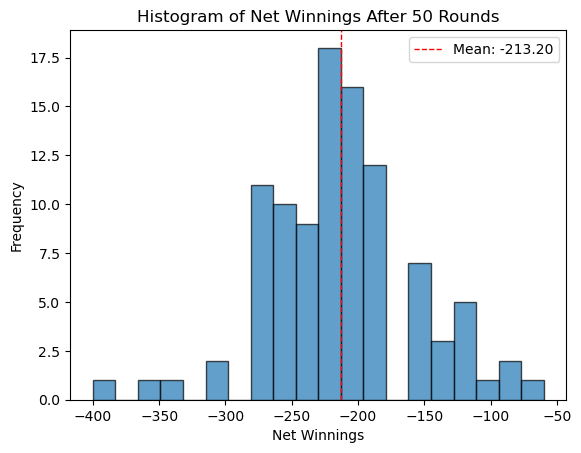

Final chips for Elite Player: 280
Net winnings: -220


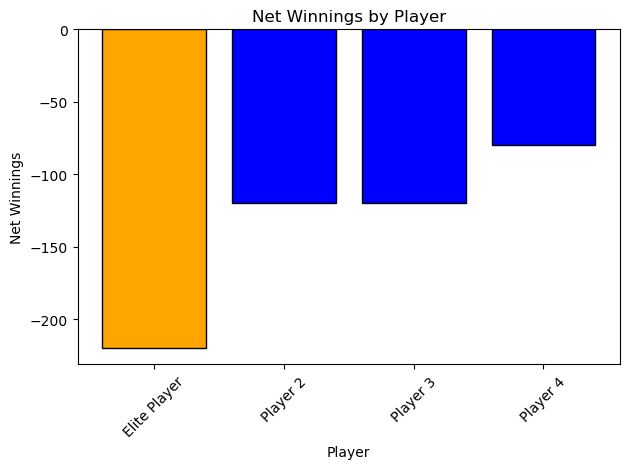

In [12]:
def simulate_games():
    num_games = 100
    num_rounds = 50
    num_players = 4
    starting_chips = 500
    elite_winnings = []

    for game_index in range(num_games):
        game = BJGame(num_players=4, verbose=False)

        # prep the the elite player strategy
        game.players[0] = Player(name="Elite Player", strategy=ElitePlayerStrategy(threshold=-2))
        for i in range(1, len(game.players)):
            game.players[i] = Player(name=f"Player {i + 1}")

        for player in game.players:
            player.chips = starting_chips

        # Play 50 rounds or until Elite Player runs out of chips
        for round_num in range(1, num_rounds + 1):
            elite_player = game.players[0]
            if elite_player.chips <= 0:
                print(f"Game {game_index + 1}: Elite Player ran out of chips at round {round_num}.")
                break  # Stop if Elite Player is out of chips
            
            # Play a game
            print(f"Game {game_index + 1}, Round {round_num}")
            game.play_round()

            for player in game.players:
                player.place_bet(min(10, player.chips))

        elite_winnings.append(game.players[0].chips)

    analyze_results(elite_winnings, starting_chips, num_rounds)
    
    # results
    elite_player = game.players[0]
    print(f"Final chips for {elite_player.name}: {elite_player.chips}")
    print(f"Net winnings: {elite_player.chips - starting_chips}")

    # Graph the final winnings and compare the players 
    final_winnings = [player.chips - starting_chips for player in game.players]
 
    colors = ['blue'] * num_players  # Default players will be blue
    colors[0] = 'orange'  # Elite Player will be orange

    plt.bar(range(len(final_winnings)), final_winnings, color=colors, edgecolor='black')
    plt.xticks(range(len(final_winnings)), [player.name for player in game.players], rotation=45)
    plt.title("Net Winnings by Player")
    plt.xlabel("Player")
    plt.ylabel("Net Winnings")
    plt.tight_layout()
    plt.show()


#analyzing the results
def analyze_results(winnings, starting_chips, num_rounds):
    winnings = np.array(winnings)
    net_winnings = winnings - starting_chips

    # compute statistics
    avg_winnings = np.mean(net_winnings)
    std_dev = np.std(net_winnings)
    prob_net_winning = np.mean(net_winnings > 0)
    prob_net_loss = np.mean(net_winnings < 0)

    print(f"After {len(winnings)} games of {num_rounds} rounds:")
    print(f"Average winnings: {avg_winnings:.2f}")
    print(f"Standard deviation: {std_dev:.2f}")
    print(f"Probability of net winnings: {prob_net_winning:.2%}")
    print(f"Probability of net loss: {prob_net_loss:.2%}")

    plt.hist(net_winnings, bins=20, edgecolor='black', alpha=0.7)
    plt.title(f"Histogram of Net Winnings After {num_rounds} Rounds")
    plt.xlabel("Net Winnings")
    plt.ylabel("Frequency")
    plt.axvline(avg_winnings, color='red', linestyle='dashed', linewidth=1, label=f"Mean: {avg_winnings:.2f}")
    plt.legend()
    plt.show()


# run simulation
simulate_games()


9. Repeat previous questions scanning the value of the threshold. Try at least 5 different threshold values. Can you find an optimal value?

Simulating for threshold -4...
Starting game!
Player 1 gets 10 of Hearts
Player 2 gets King of Clubs
Player 3 gets 3 of Clubs
Elite Player gets 2 of Diamonds
Dealer shows King of Hearts
Player 1 gets 4 of Hearts
Player 2 gets 10 of Clubs
Player 3 gets 10 of Clubs
Elite Player gets 6 of Diamonds
Dealer shows 4 of Diamonds

Player 1's turn:
Player 1 hits: Queen of Diamonds
Player 1 busts with 24 :(

Player 2's turn:
Player 2 stands with 20

Player 3's turn:
Player 3 hits: King of Hearts
Player 3 busts with 23 :(

Elite Player's turn:
Elite Player stands with 8

Dealer's turn:
Dealer hits: 2 of Diamonds
Dealer hits: 9 of Clubs
Dealer busts
Dealer's final hand: [King of Hearts, 4 of Diamonds, 2 of Diamonds, 9 of Clubs], Value: 25
Player 1's final hand: [10 of Hearts, 4 of Hearts, Queen of Diamonds], Value: 24
Player 1 busted :(
Player 2's final hand: [King of Clubs, 10 of Clubs], Value: 20
Player 2 wins!
Player 3's final hand: [3 of Clubs, 10 of Clubs, King of Hearts], Value: 23
Player 3 b

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Player 1 gets Ace of Diamonds
Player 2 gets Queen of Clubs
Player 3 gets 2 of Clubs
Elite Player gets 4 of Clubs
Dealer shows Jack of Hearts
Player 1 gets 2 of Diamonds
Player 2 gets 9 of Hearts
Player 3 gets King of Diamonds
Elite Player gets 8 of Spades
Dealer shows 4 of Diamonds

Player 1's turn:
Player 1 hits: 4 of Spades
Player 1 stands with 17

Player 2's turn:
Player 2 stands with 19

Player 3's turn:
Player 3 hits: Ace of Clubs
Player 3 hits: 10 of Spades
Player 3 busts with 23 :(

Elite Player's turn:
Elite Player stands with 12

Dealer's turn:
Dealer hits: Queen of Hearts
Dealer busts
Dealer's final hand: [Jack of Hearts, 4 of Diamonds, Queen of Hearts], Value: 24
Player 1's final hand: [Ace of Diamonds, 2 of Diamonds, 4 of Spades], Value: 17
Player 1 wins!
Player 2's final hand: [Queen of Clubs, 9 of Hearts], Value: 19
Player 2 wins!
Player 3's final hand: [2 of Clubs, King of Diamonds, Ace of Clubs, 10 of Spades], Value: 23
Player 3 busted :(
Elite Player's final hand: [4 o

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Player 2 hits: 4 of Spades
Player 2 stands with 18

Player 3's turn:
Player 3 stands with 18

Elite Player's turn:
Elite Player hits: 10 of Spades
Elite Player hits: 5 of Clubs
Elite Player busts with 25 :(

Dealer's turn:
Dealer hits: 10 of Diamonds
Dealer hits: 7 of Hearts
Dealer stands with 21
Dealer's final hand: [2 of Clubs, 2 of Hearts, 10 of Diamonds, 7 of Hearts], Value: 21
Player 1's final hand: [8 of Clubs, Queen of Diamonds], Value: 18
Dealer wins against Player 1.
Player 2's final hand: [3 of Clubs, 4 of Spades, 7 of Clubs, 4 of Spades], Value: 18
Dealer wins against Player 2.
Player 3's final hand: [8 of Spades, Queen of Spades], Value: 18
Dealer wins against Player 3.
Elite Player's final hand: [3 of Spades, 7 of Spades, 10 of Spades, 5 of Clubs], Value: 25
Elite Player busted :(
Player 1 lost 0 chips.
Player 2 lost 0 chips.
Player 3 lost 0 chips.
Elite Player lost 0 chips.
Player 1 gets 2 of Clubs
Player 2 gets Queen of Hearts
Player 3 gets 10 of Clubs
Elite Player gets

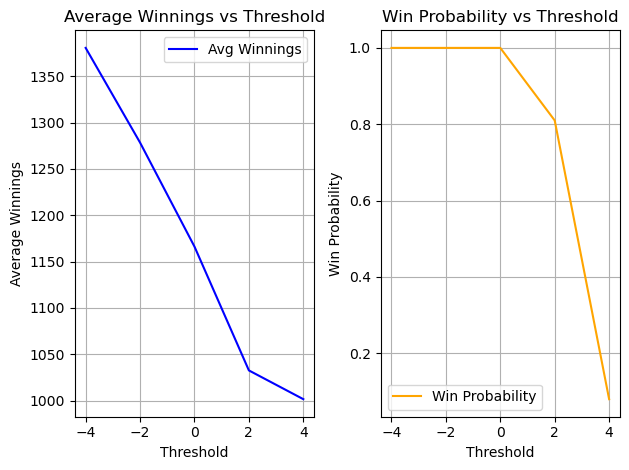

In [13]:
def simulate_threshold(threshold, num_games=100, rounds_per_game=50):
    winnings = [] 
    for game_num in range(num_games):
        #set up
        game = BJGame(num_players=3, num_decks=6)  # 3 players and dealer to start then add elite player
        elite_player = Player(name="Elite Player", strategy=ElitePlayerStrategy(threshold))
        game.players.append(elite_player)
        
        for round_number in range(rounds_per_game):
            if elite_player.chips <= 0:
                break
            game.play_round()
        
        winnings.append(elite_player.chips)
    return winnings


# thresholds to test
thresholds = [-4, -2, 0, 2, 4]

threshold_results = {} # store the tresholds

for threshold in thresholds:
    print(f"Simulating for threshold {threshold}...")
    winnings = simulate_threshold(threshold)
    threshold_results[threshold] = winnings
    print(f"Threshold {threshold} simulation complete.")

# analyze results
average_winnings = {threshold: np.mean(winnings) for threshold, winnings in threshold_results.items()}
std_devs = {threshold: np.std(winnings) for threshold, winnings in threshold_results.items()}
win_probabilities = {threshold: np.mean(np.array(winnings) > 1000) for threshold, winnings in threshold_results.items()}

# summary
print("\nThreshold Analysis Results:")
print("Threshold\tAverage Winnings\tStd Dev\tWin Probability")
for threshold in thresholds:
    print(f"{threshold}\t\t{average_winnings[threshold]:.2f}\t\t{std_devs[threshold]:.2f}\t\t{win_probabilities[threshold]:.2f}")

plt.subplot(1, 2, 1)
plt.plot(thresholds, [average_winnings[threshold] for threshold in thresholds], color='blue', label='Avg Winnings')
plt.xlabel("Threshold")
plt.ylabel("Average Winnings")
plt.title("Average Winnings vs Threshold")
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(thresholds, [win_probabilities[threshold] for threshold in thresholds], color='orange', label='Win Probability')
plt.xlabel("Threshold")
plt.ylabel("Win Probability")
plt.title("Win Probability vs Threshold")
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()


From these results we can see that a lower threshold results in a higher probability of winning while a higher threshold results in lower probability of winning.

10. Create a new strategy based on web searches or your own ideas. Demonstrate that the new strategy will result in increased or decreased winnings. 

In [14]:
class RiskAdjustedStrategy:
    def __init__(self, low_threshold=200, high_threshold=700):
        self.low_threshold = low_threshold
        self.high_threshold = high_threshold
        self.player_chips = 0  # assess player's chip count throughout the game to 

    def update_chips(self, chips):
        self.player_chips = chips # current chip value

    def execute(self, hand, dealer_card, deck):
        if self.player_chips < self.low_threshold:
            if hand.calculate_value() < 17:
                return 'hit'
            else:
                return 'stand'
        elif self.player_chips > self.high_threshold:
            if hand.calculate_value() < 19:
                return 'hit'
            else:
                return 'stand'
        else:
            if hand.calculate_value() < 15:
                return 'hit'
            else:
                return 'stand'


In [15]:
risk_strategy = RiskAdjustedStrategy()

risk_player = Player(name="Risk Player", strategy=risk_strategy)

# Update strategy with the player's chip count before the round
risk_strategy.update_chips(risk_player.chips)

# Add the player to the game
game.players.append(risk_player)


In [17]:
thresholds = [-2]  # For ElitePlayerStrategy
risk_adjusted_winnings = []

for threshold in thresholds:
    # Setup ElitePlayerStrategy
    elite_strategy = ElitePlayerStrategy(threshold=threshold)
    elite_player = Player(name=f"ElitePlayer_{threshold}", strategy=elite_strategy)
    
    # Setup RiskAdjustedStrategy
    risk_strategy = RiskAdjustedStrategy(low_threshold=200, high_threshold=700)
    risk_player = Player(name="Risk Player", strategy=risk_strategy)

    # Play 100 games of 50 rounds
    elite_winnings = []
    risk_winnings = []
    for game_number in range(100):
        game = BJGame(num_players=3, num_decks=6)
        game.players.append(elite_player)
        game.players.append(risk_player)

        for player in game.players:
            player.chips = 1000 

        for _ in range(50):
            game.play_round()

        # Calculate and store net winnings
        elite_winnings.append(elite_player.chips - 1000)
        risk_winnings.append(risk_player.chips - 1000)

    risk_adjusted_winnings.append(risk_winnings)

    # Analyze and graph results
    plt.figure(figsize=(10, 6))
    
    # Elite Player
    plt.hist(elite_winnings, bins=20, alpha=0.7, label=f"Elite Player (Threshold {threshold})", color='orange')
    
    # Risk Player
    plt.hist(risk_winnings, bins=20, alpha=0.7, label="Risk Player", color='skyblue')
 
    plt.title(f"Net Winnings Distribution for Elite and Risk Players (Threshold {threshold})", fontsize=14, weight='bold')
    plt.xlabel("Net Winnings (chips)", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.legend()
    
    plt.tight_layout()
    plt.show()

    # Print average and std dev for each player's net winnings
    avg_elite_winnings = np.mean(elite_winnings)
    std_dev_elite_winnings = np.std(elite_winnings)
    avg_risk_winnings = np.mean(risk_winnings)
    std_dev_risk_winnings = np.std(risk_winnings)

    print(f"Elite Player (At Threshold of -2): Avg= {avg_elite_winnings}, Std Dev= {std_dev_elite_winnings}")
    print(f"Risk Player: Avg= {avg_risk_winnings}, Std Dev= {std_dev_risk_winnings}")


Starting game!
Player 1 gets 10 of Hearts
Player 2 gets 4 of Hearts
Player 3 gets Jack of Hearts
ElitePlayer_-2 gets 8 of Hearts
Risk Player gets 6 of Diamonds
Dealer shows 4 of Diamonds
Player 1 gets 4 of Clubs
Player 2 gets 3 of Spades
Player 3 gets Jack of Spades
ElitePlayer_-2 gets 6 of Spades
Risk Player gets 8 of Diamonds
Dealer shows 5 of Clubs

Player 1's turn:
Player 1 hits: 10 of Hearts
Player 1 busts with 24 :(

Player 2's turn:
Player 2 hits: 10 of Clubs
Player 2 stands with 17

Player 3's turn:
Player 3 stands with 20

ElitePlayer_-2's turn:
ElitePlayer_-2 stands with 14

Risk Player's turn:
Risk Player hits: Queen of Hearts
Risk Player busts with 24 :(

Dealer's turn:
Dealer hits: 4 of Clubs
Dealer hits: 10 of Hearts
Dealer busts
Dealer's final hand: [4 of Diamonds, 5 of Clubs, 4 of Clubs, 10 of Hearts], Value: 23
Player 1's final hand: [10 of Hearts, 4 of Clubs, 10 of Hearts], Value: 24
Player 1 busted :(
Player 2's final hand: [4 of Hearts, 3 of Spades, 10 of Clubs], Va

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

